In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import sys
import os
from dotmap import DotMap
from tqdm import tqdm
from PIL import Image, ImageOps
from torchvision import transforms

sys.path.append("/home/warburg/repo/bayesian-metric-learning/src")

from datasets.cub200 import TestDataset
from models import configure_model
from lightning.laplace_posthoc_model import LaplacePosthocModel
from evaluate.ranking import compute_rank
from evaluate.evaluate import evaluate
from evaluate.utils import get_pos_idx, get_pos_idx_place_recognition, remove_duplicates

In [2]:
args = {"dataset": "cub200", 
        "resume_posthoc": "../lightning_logs/cub200/laplace_posthoc/1/contrastive/full/checkpoints/best.ckpt",
        "resume": "../lightning_logs/cub200/deterministic",
        "data_dir": "/home/warburg/data",        
        "arch": "resnet50", 
        "pool": "gem",
        "model": "laplace_posthoc",
        "whitening": True, 
        "pretrained": True, 
        "dropout_rate": 0.0, 
        "latent_dim": 512}
args = DotMap(args)

In [3]:
model = LaplacePosthocModel(args, ".", 1)

>> Using pre-trained model 'resnet50'


/home/warburg/miniconda3/envs/py39/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/warburg/miniconda3/envs/py39/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


==> test n_samples:  100


In [4]:
def rename_keys(statedict):

    new_dict = {k.replace("model.", ""): statedict[k] for k in statedict.keys()}
    return new_dict


statedict = torch.load(args.resume_posthoc, map_location="cpu")
statedict = statedict["state_dict"] if "statedict" in statedict else statedict
#statedict = rename_keys(statedict)
model.load_state_dict(statedict)
model.eval()
model = model.cuda()
#model.n_test_samples=1
#model.hessian = torch.zeros_like(model.hessian) # (very large variance)
#model.hessian = 1e12 * torch.ones_like(model.hessian) # (very small variance)

#model.model.linear[0].weight.data = model.model.linear[0].weight.data + torch.randn_like(model.model.linear[0].weight.data) # * 1 / (1 + 1e-6) 
#model.model.linear[0].bias.data = model.model.linear[0].bias.data + torch.randn_like(model.model.linear[0].bias.data) #* 1 / (1 + 1e-6)

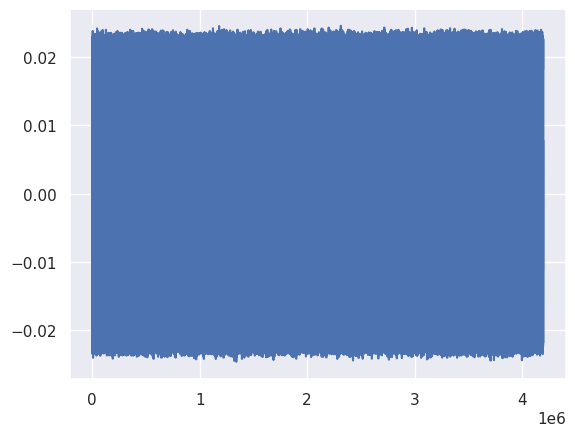

In [5]:
from torch.nn.utils import parameters_to_vector, vector_to_parameters
mu_q = parameters_to_vector(model.model.linear.parameters()).unsqueeze(1)

plt.plot(mu_q.detach().cpu().numpy())
plt.show()

In [6]:
data = TestDataset(args.data_dir)
dataloader = torch.utils.data.DataLoader(data, batch_size=64, shuffle=False)

In [7]:
model.sample(n_samples=model.test_n_samples)

outputs = []
for i, batch in tqdm(enumerate(dataloader), total=len(dataloader)):
    with torch.no_grad():
        o = model(batch[0].cuda())
    o = {k : v.cpu() for k, v in o.items()}
    o["label"] = batch[1]
    outputs.append(o)


100%|██████████| 93/93 [01:10<00:00,  1.31it/s]


In [8]:
def format_outputs(outputs, place_rec=False):

    z_mu = torch.cat([o["z_mu"] for o in outputs])
    if not place_rec:
        targets = torch.cat([o["label"] for o in outputs])
        pidxs = get_pos_idx(targets)
        z_muQ = z_mu
        z_muDb = None
    else:

        index = torch.cat([o["index"] for o in outputs], dim=1)
        utm = torch.cat([o["utm"] for o in outputs])

        queries = index[1, :] == -1
        database = ~queries

        z_muQ = z_mu[queries]
        z_muDb = z_mu[database]
        utmQ = utm[queries]
        utmDb = utm[database]
        idxQ = index[0, :][queries]
        idxDb = index[1, :][database]
        z_muQ, z_muDb, utmQ, utmDb = remove_duplicates(
            z_muQ, z_muDb, utmQ, utmDb, idxQ, idxDb
        )

        pidxs = get_pos_idx_place_recognition(utmQ, utmDb, 25)

    if z_muDb is not None and len(z_muDb) == 0:
        return

    o = {"z_muQ": z_muQ, "z_muDb": z_muDb, "pidxs": pidxs}
    if not place_rec:
        o["targets"] = targets

    if "z_sigma" in outputs[0]:
        z_sigma = torch.cat([o["z_sigma"] for o in outputs])
        if z_muDb is None:
            # merge dicts
            o = {**o, **{"z_sigmaQ": z_sigma, "z_sigmaDb": None}}

    if "z_samples" in outputs[0]:
        z_samples = torch.cat([o["z_samples"] for o in outputs])
        if z_muDb is None:
            # merge dicts
            o = {**o, **{"z_samplesQ": z_samples, "z_samplesDb": None}}

    return o

In [9]:
outputs = format_outputs(outputs, place_rec=args.datasets == "msls")

In [10]:

torch.mean(outputs["z_muQ"]), torch.std(outputs["z_muQ"]), torch.max(outputs["z_muQ"]), torch.min(outputs["z_muQ"])

# hessian : (tensor(2.1925e-05), tensor(0.0221), tensor(0.1198), tensor(-0.1223))
# zero-hessian : (tensor(-6.4534e-05), tensor(0.0221), tensor(0.1129), tensor(-0.1183))
# 1e12 * torch.ones_like(model.hessian) : (tensor(4.7797e-05), tensor(0.0221), tensor(0.1040), tensor(-0.1237))
# zero-hessian + random weights : (tensor(-0.0003), tensor(0.0221), tensor(0.1172), tensor(-0.1110))

(tensor(-0.0003), tensor(0.0221), tensor(0.1054), tensor(-0.1128))

In [11]:
def compute_distances(embed, ref_embed):

    if ref_embed is None:
        same_source = True
        ref_embed = embed
    else:
        same_source = False

    dist = embed @ ref_embed.T
    dist = torch.sort(-dist, dim=1)[0]
    return dist

dist = compute_distances(outputs["z_muQ"], outputs["z_muDb"])

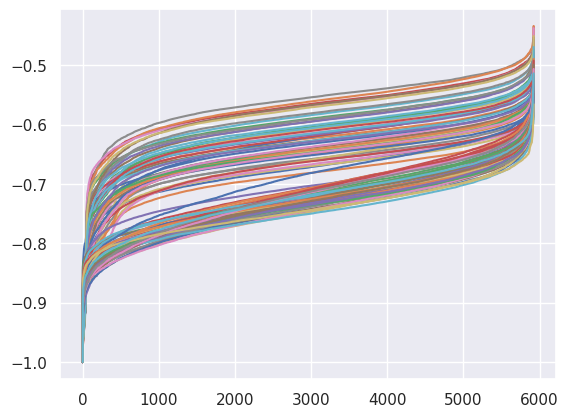

In [12]:
for i in range(100):
    plt.plot(dist[i])
plt.show()

In [13]:

ranks = compute_rank(outputs["z_muQ"], ref_embed=outputs["z_muDb"])
evaluate(ranks, outputs["pidxs"])

# actual hessian
# {'map': [0.9044913346837723, 0.8756287378219351, 0.8261979004220512],
# 'recall': [0.9419311276164753,0.9888588791357191, 0.9944294395678596, 0.9972991222147198]}

# constant zero hessian
#{'map': [0.9045476029709656, 0.8756013807165901, 0.8266893573865639],
# 'recall': [0.9429439567859554, 0.9888588791357191,0.9945982444294396,0.9974679270762998]}

# constant large hessian
#{'map': [0.4889562232725636, 0.42402892993794405, 0.35429398773613835],
# 'recall': [0.6185010128291695,0.8463875759621877,0.9036124240378123,0.9471640783254558]}

# zero-hessian + random weights
#{'map': [0.9055615575061896, 0.8761131742816416, 0.8266650355233139],
# 'recall': [0.9427751519243754,0.988183659689399,0.9944294395678596,0.9972991222147198]}

# new code batch 64 (zero hessian)
#{'map': [0.5129962862930452, 0.44454103833745967, 0.3709582416488936],
#'recall': [0.6434841323430115, 0.8565158676569885,0.9137407157326131,0.9515530047265361]}

# new code batch 1 (zero hessian)
#{'map': [0.5122709880711231, 0.44506842625639054, 0.3692427238594921],
#'recall': [0.6426401080351114, 0.8561782579338285, 0.9130654962862931, 0.9534098582039163]}

# new code batch 1 (large hessian)
#{'map': [0.4889207742516318, 0.4238920372335295, 0.35435943598204167],
# 'recall': [0.6186698176907495, 0.8463875759621877, 0.9041188386225524, 0.9473328831870358]}

# new code batch 64 (large hessian)
#{'map': [0.4889562232725636, 0.42401586095838284, 0.3542876097194706],
# 'recall': [0.6185010128291695, 0.8463875759621877, 0.9036124240378123, 0.9471640783254558]}

# new code batch 64 (zero hessian ) shuffle
# {'map': [0.5112514067071798, 0.44386776148676893, 0.36975269493026924],
# 'recall': [0.6414584740040513,0.8600607697501688, 0.9154287643484132, 0.9537474679270763]}

# new code batch 64 (large hessian ) shuffle random weigghts
#'map': [0.5116351564258383, 0.4435668467251856, 0.3691867560019109],
#'recall': [0.6424713031735314,0.8588791357191087, 0.9147535449020932,0.9537474679270763]}


{'map': [0.5134076074724285, 0.4467093434830606, 0.3720150187304974],
 'recall': [0.6428089128966914,
  0.861580013504389,
  0.9162727886563133,
  0.9537474679270763]}

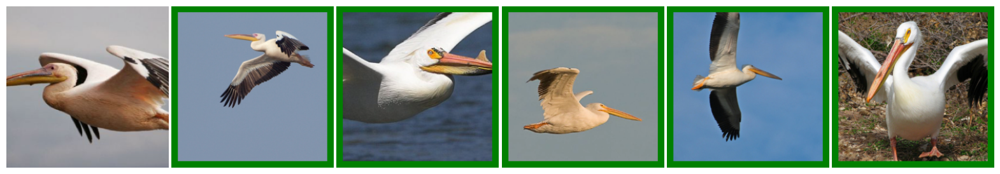

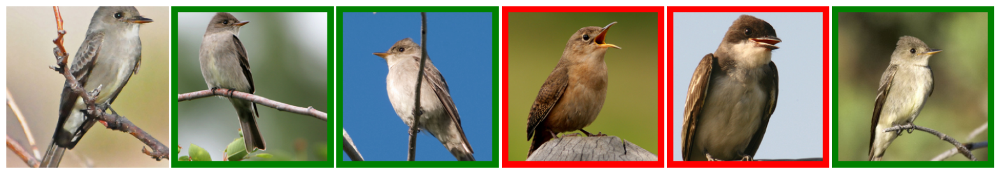

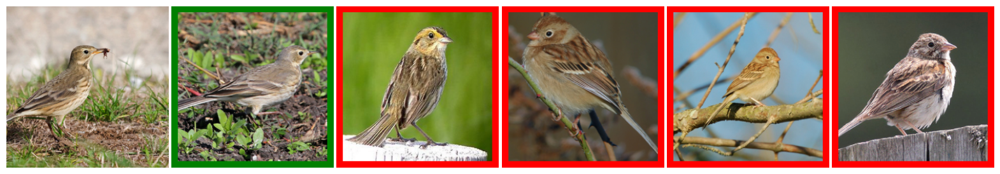

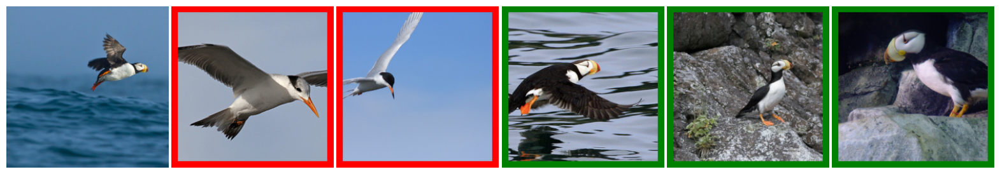

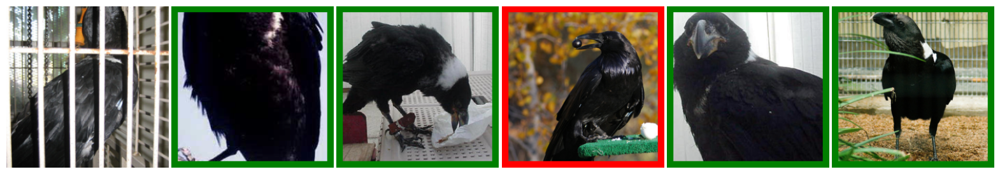

...

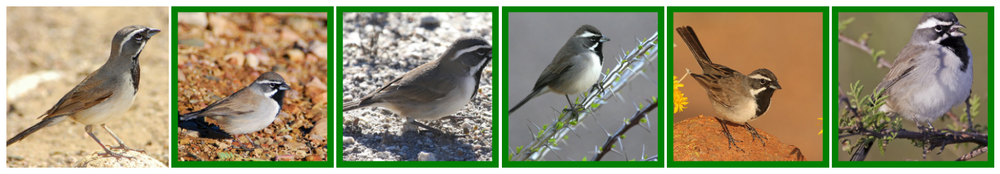

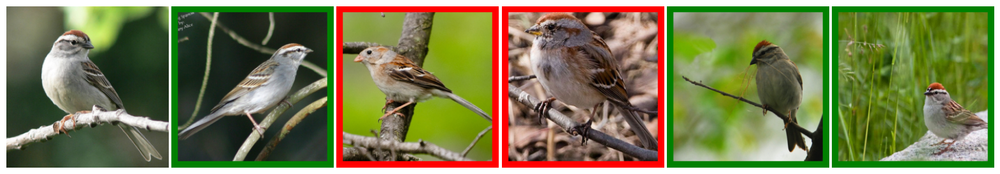

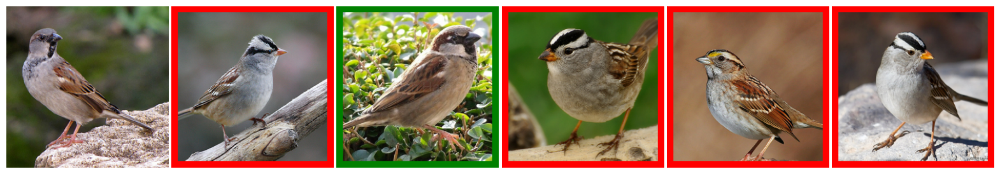

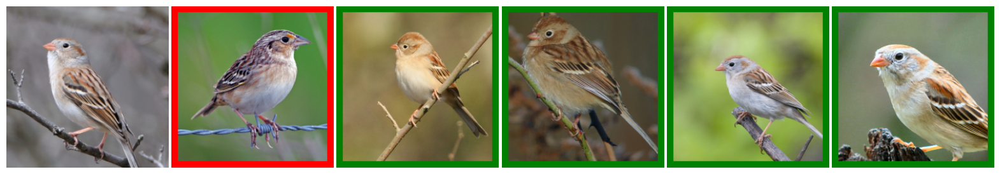

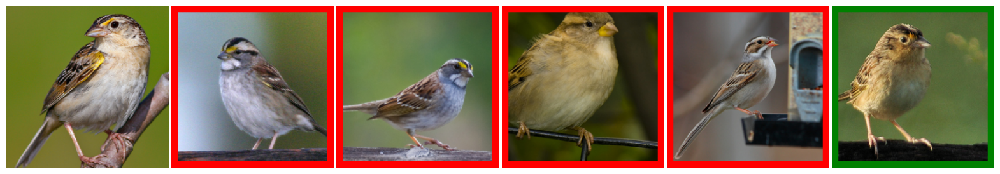

In [14]:
inv_normalize = transforms.Normalize(
    mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
    std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
)
transform = transforms.ToPILImage()

for q_id in [0,100,200,300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]:

    fig, ax = plt.subplots(1, 6, figsize=(20, 20))

    im, q_label = data.__getitem__(q_id)
    im = inv_normalize(im)
    ax[0].imshow(im.permute(1, 2, 0))
    ax[0].axis("off")

    for i, n_idx in enumerate(ranks[q_id, :5]):
        im, n_label = data.__getitem__(n_idx)
        im = inv_normalize(im)
        #im = im.permute(1, 2, 0)
        im = transform(im)

        
        if q_label == n_label:
            # color border green
            im = ImageOps.expand(im,border=10,fill='green')
        else:
            # color border red
            im = ImageOps.expand(im,border=10,fill='red')

        ax[i+1].imshow(im)
        ax[i+1].axis("off")
        
    plt.subplots_adjust(wspace=0.02, hspace=0)
    plt.show()